In [2]:
import os
os.chdir('..')
os.getcwd()

'/home/leowyaoyang/fyp-graph-clustering'

In [21]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

import pickle 
import numpy as np
import pandas as pd
import torch
import os
from timeit import default_timer as timer

In [3]:
from core.GraphConvNet2 import GraphConvNet2
from core.DataEmbeddingGraph import DataEmbeddingGraph

In [11]:
if torch.cuda.is_available():
    print('cuda available')
    device = 'cuda'
else:
    print('cuda not available')
    device = 'cpu'

cuda available


In [5]:
parent_dir = os.path.abspath('..')
test_file = '/data/yux_test_tsne_shuffle.pkl'
with open(parent_dir+test_file, 'rb') as f:
    [inputs, labels, X_emb] = pickle.load(f)

In [9]:
print(inputs.shape)
print(len(labels))
print(X_emb.shape)

(1393, 66)
0
(1393, 2)


In [8]:
data_dir = '/data/tops_shuffled.csv'
df = pd.read_csv(parent_dir + data_dir)

In [14]:
G = DataEmbeddingGraph(inputs, labels)

In [12]:
net_parameters = {}
net_parameters['n_components'] = 2
net_parameters['D'] = 66 # input dimension
net_parameters['H'] = 50 # number of hidden units
net_parameters['L'] = 10 # number of hidden layers
net_parameters['n_channels'] = 1
net_parameters['n_units_1'] = net_parameters['n_units_2'] = net_parameters['H']

In [13]:
# Graph net
net = GraphConvNet2(net_parameters)
if torch.cuda.is_available(): net.cuda()
root = 'results/yux_preprocessed_tsne1/'
filename = root + 'graph_net5.pkl'
checkpoint = torch.load(filename, map_location=device)
net.load_state_dict(checkpoint['state_dict'])

In [15]:
# Net
if torch.cuda.is_available():   
    y_pred = net.forward(G).cpu().detach().numpy()
else:    
    y_pred = net.forward(G).detach().numpy()

In [63]:
from socket import timeout
import urllib
from urllib.error import HTTPError, URLError
    
def getImageFromUrl(url):
    try:
        response = urllib.request.urlopen(url, timeout=10)
    except (HTTPError, URLError) as error:
        return None
    except timeout:
        return None
    else:
        #print('Access successful.')
        image = urllib.request.urlopen(url)
        return plt.imread(image, 'jpg')

def imscatter(X, images, ax=None, zoom=1, highlight= False):
    if ax is None:
        ax = plt.gca()
    
    for i in range(X.shape[0]):
        im = OffsetImage(images[i], zoom=zoom)
        if highlight:
            ab = AnnotationBbox(im, (X[i,0], X[i,1]), xycoords='data', frameon=True, bboxprops=dict(edgecolor='red'))
        else:
            ab = AnnotationBbox(im, (X[i,0], X[i,1]), xycoords='data', frameon=False)
        ax.add_artist(ab)
    ax.update_datalim(np.column_stack([X[:,0], X[:,1]]))
    ax.autoscale()

In [19]:
n_train = 7000
n_plot = 1000
X_plot = np.zeros((n_plot, 2))
i = 0
images = []
while len(images) < n_plot:
    img = getImageFromUrl(df.loc[n_train+i]['image_url'])
    if img is not None:
        X_plot[len(images)] = y_pred[i]
        images.append(img)
        if len(images)%100 == 0: print(len(images))
    i += 1

100
200
300
400
500
600
700
800
900
1000


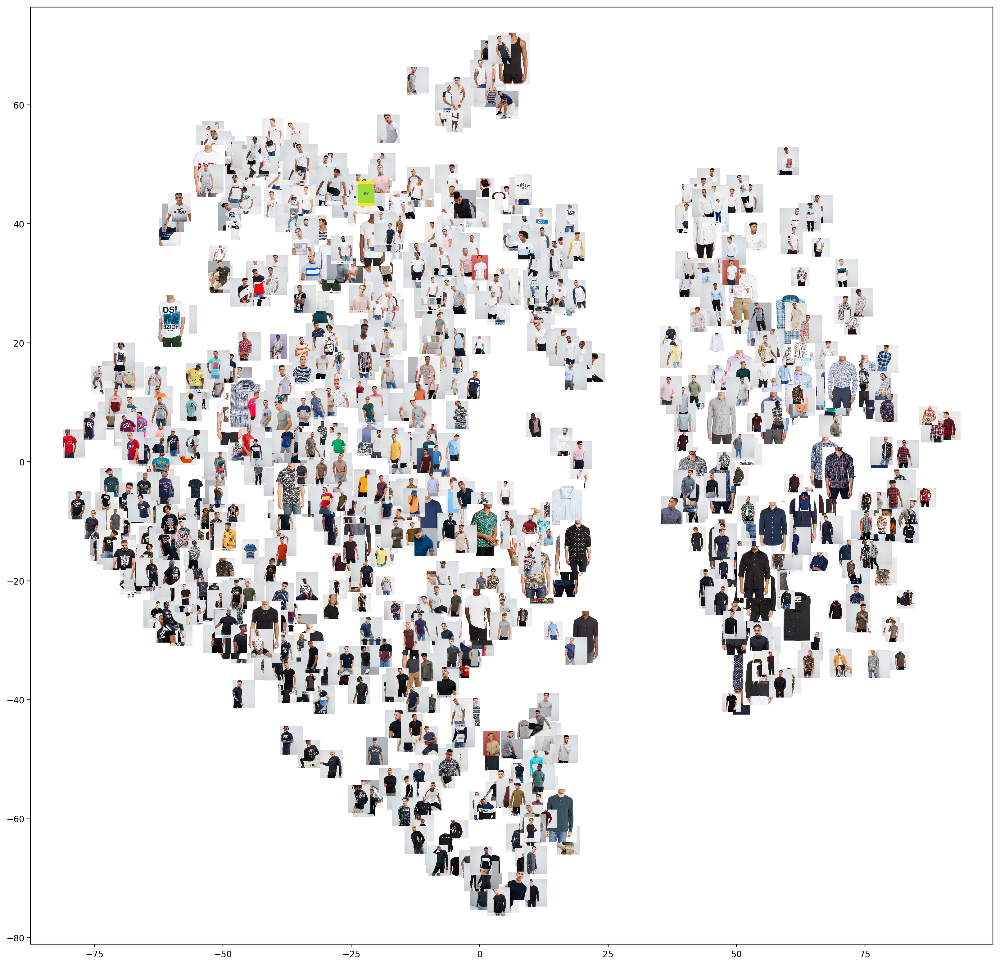

In [22]:
f, ax = plt.subplots(1, 1, sharex='col', sharey='row', figsize=(20,20), dpi=200)
imscatter(X_plot, images, zoom=0.05, ax=ax)
plt.show()

In [51]:
n_small = 50
G_small = DataEmbeddingGraph(inputs[:n_small], labels, None)

In [52]:
# Net
if torch.cuda.is_available():   
    y_pred = net.forward(G_small).cpu().detach().numpy()
else:    
    y_pred = net.forward(G_small).detach().numpy()

In [53]:
y_pred.shape

(50, 2)

In [54]:
n_train = 7000
n_plot = n_small
test_X_plot = np.zeros((n_plot, 2))
i = 0
test_images = []
for i in range(n_plot):
    img = getImageFromUrl(df.loc[n_train+i]['image_url'])
    if img is not None:
        test_X_plot[len(test_images)] = y_pred[i]
        test_images.append(img)
        if len(test_images)%100 == 0: print(len(test_images))

In [55]:
test_X_plot = test_X_plot[:len(test_images)]

In [56]:
test_X_plot.shape

(44, 2)

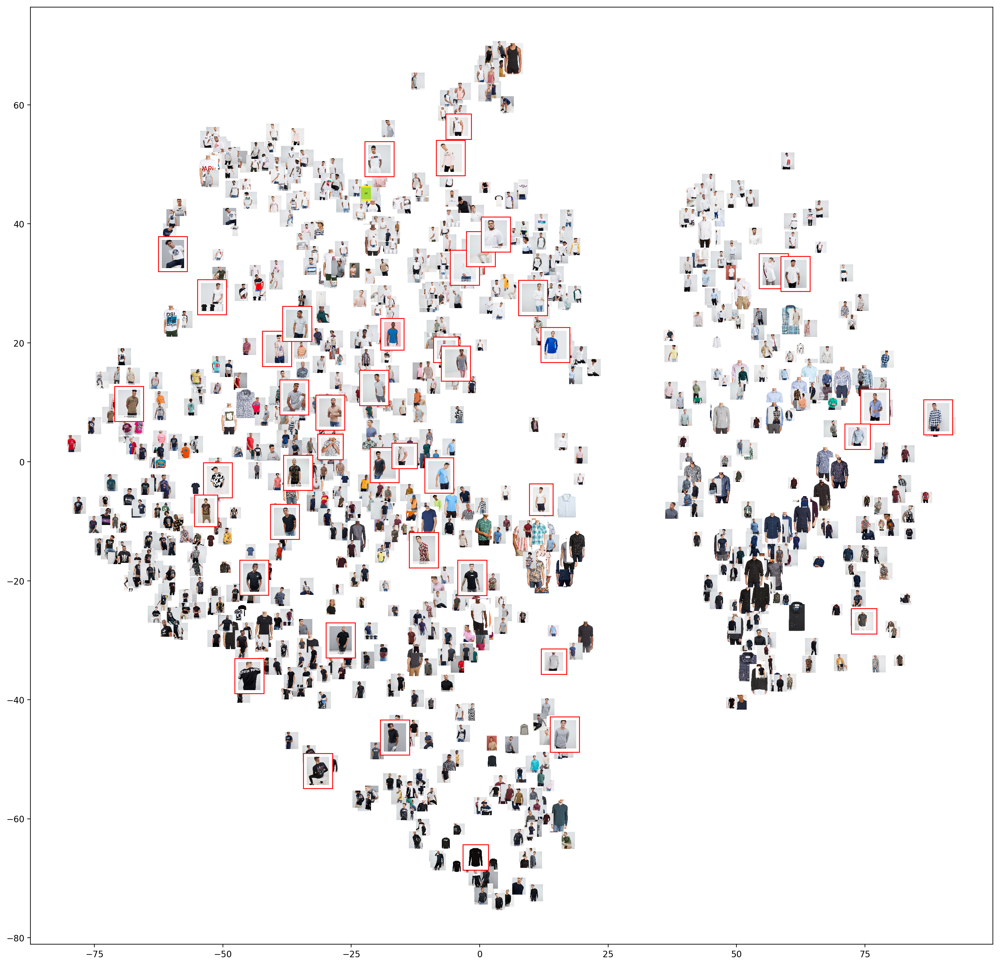

In [64]:
f, ax = plt.subplots(1, 1, sharex='col', sharey='row', figsize=(20,20), dpi=200)
imscatter(X_plot, images, zoom=0.03, ax=ax)
imscatter(test_X_plot, test_images, zoom=0.05, ax=ax, highlight=True)
plt.show()